# Atividade: GANs

Neste notebook, você irá **preparar seu próprio dataset** e **treinar uma DCGAN utilizando a distância de Wasserstein**.
O objetivo é gerar imagens sintéticas a partir de ruído, aprendendo a distribuição dos dados reais.

O treinamento será realizado com um **Gerador** e um **Crítico** (substituindo o discriminador tradicional), aplicando **gradient clipping** para garantir a restrição de Lipschitz exigida pela métrica de Wasserstein.

Ao final, o modelo deverá ser capaz de **produzir imagens realistas** a partir de vetores aleatórios.

## Preparando os dados

Para esta atividade, será necessário baixar ou montar um dataset de imagens de um domínio específico (por exemplo, rostos, paisagens, objetos, etc.). Você pode utilizar datasets públicos como LFW e CelebA ou criar o seu próprio conjunto de imagens armazenadas em uma pasta local.

### Coleta de Imagens

Caso opte por montar seu próprio dataset, você pode utilizar a biblioteca iCrawler para baixar imagens automaticamente a partir de buscadores (como Google, Bing ou Baidu), fornecendo uma lista de termos relacionados ao domínio desejado.

In [8]:
!pip install icrawler

In [10]:
import os
from icrawler.builtin import GoogleImageCrawler, BingImageCrawler

def download_images(keyword, folder, n_total=100):
    os.makedirs(folder, exist_ok=True)
    downloaded = len(os.listdir(folder))
    remaining = n_total - downloaded

    while downloaded < n_total:
        crawler = BingImageCrawler(storage={'root_dir': folder})
        crawler.crawl(keyword=keyword, max_num=remaining, file_idx_offset=downloaded)
        downloaded = len(os.listdir(folder))
        remaining = n_total - downloaded
        print(f"Downloaded {downloaded}/{n_total}")

    print("Download complete!")

In [11]:
download_images("silver surfer", f"data/silver", n_total=200)

ERROR:downloader:Response status code 404, file https://static.wikia.nocookie.net/p__/images/f/f1/SilverSurferRebirth.jpg
ERROR:downloader:Response status code 403, file https://comicvine.gamespot.com/a/uploads/original/4/43640/919483-silver_surfer__take_2_by_espeng.jpg


Downloaded 29/200


ERROR:downloader:Response status code 404, file https://static.wikia.nocookie.net/p__/images/f/f1/SilverSurferRebirth.jpg
ERROR:downloader:Response status code 403, file https://comicvine.gamespot.com/a/uploads/original/4/43640/919483-silver_surfer__take_2_by_espeng.jpg


Downloaded 58/200


ERROR:downloader:Response status code 404, file https://static.wikia.nocookie.net/p__/images/f/f1/SilverSurferRebirth.jpg
ERROR:downloader:Response status code 403, file https://comicvine.gamespot.com/a/uploads/original/4/43640/919483-silver_surfer__take_2_by_espeng.jpg


Downloaded 87/200


ERROR:downloader:Response status code 404, file https://static.wikia.nocookie.net/p__/images/f/f1/SilverSurferRebirth.jpg
ERROR:downloader:Response status code 403, file https://comicvine.gamespot.com/a/uploads/original/4/43640/919483-silver_surfer__take_2_by_espeng.jpg


Downloaded 116/200


ERROR:downloader:Response status code 404, file https://static.wikia.nocookie.net/p__/images/f/f1/SilverSurferRebirth.jpg
ERROR:downloader:Response status code 403, file https://comicvine.gamespot.com/a/uploads/original/4/43640/919483-silver_surfer__take_2_by_espeng.jpg
ERROR:downloader:Response status code 403, file https://www.financialexpress.com/wp-content/uploads/2024/10/silver.reutrs.jpg


Downloaded 154/200


ERROR:downloader:Response status code 404, file https://static.wikia.nocookie.net/p__/images/f/f1/SilverSurferRebirth.jpg
ERROR:downloader:Response status code 403, file https://comicvine.gamespot.com/a/uploads/original/4/43640/919483-silver_surfer__take_2_by_espeng.jpg


Downloaded 183/200


ERROR:downloader:Response status code 404, file https://static.wikia.nocookie.net/p__/images/f/f1/SilverSurferRebirth.jpg


Downloaded 200/200
Download complete!


### Implementação do Dataset

Com as imagens já disponíveis, implemente uma **classe de Dataset personalizada** para o PyTorch. Ela deve herdar de `Dataset` e retornar, em cada amostra, a imagem processada pelos **transforms** definidos anteriormente.

O Dataset deve:

* Ler as imagens a partir de uma pasta.
* Converter as imagens para **tensor normalizado** (ex.: valores entre -1 e 1).

In [12]:
from PIL import Image
from torch.utils.data import Dataset, DataLoader

class ImageDataset(Dataset):
    def __init__(self, folder, transform=None):
        self.folder = folder
        self.transform = transform
        self.images = [
            os.path.join(folder, f)
            for f in os.listdir(folder)
            if f.lower().endswith((".png", ".jpg", ".jpeg"))
        ]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img

### Carregamento

Carregue os dados a partir do seu dataset de imagens e aplique os transforms necessários. Caso o dataset seja pequeno, recomenda-se o uso de data augmentation (como flips horizontais, jitter de cor ou pequenas rotações) para aumentar a diversidade das amostras e melhorar a estabilidade do treinamento adversarial. Em seguida, defina um batch size adequado e instancie um DataLoader.

In [13]:
import torchvision.transforms as T

# 1. Definir o pipeline de transformações
# Este pipeline será aplicado a cada imagem carregada do dataset.
transform = T.Compose([
    # Redimensiona todas as imagens para um tamanho fixo de 64x64 pixels.
    T.Resize((64, 64)),

    # Caso tenha poucas imagens, adicione data augmentation aqui
    # Adicionamos um flip horizontal aleatório com 50% de chance.
    # Isso aumenta a diversidade dos dados, o que é crucial para datasets pequenos.
    T.RandomHorizontalFlip(p=0.5),

    # Converte a imagem do formato PIL para um tensor PyTorch (valores de 0 a 1).
    T.ToTensor(),

    # Normaliza o tensor para o intervalo [-1, 1], que corresponde à saída da Tanh do Gerador.
    T.Normalize([0.5]*3, [0.5]*3)
])

# 2. Instanciar o Dataset e o DataLoader
# Caminho para a pasta onde suas imagens do "Silver Surfer" foram salvas.
dataset_folder = "data/silver"
# Tamanho do lote (batch size) a ser usado no treinamento.
BATCH_SIZE = 64

# Cria o dataset usando a classe ImageDataset que definimos na etapa anterior.
train_dataset = ImageDataset(folder=dataset_folder, transform=transform)

# Cria o DataLoader para agrupar as imagens em lotes e embaralhá-las.
train_loader = DataLoader(
    dataset=train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True
)

# Verificação para confirmar que tudo foi carregado corretamente
print(f"Dataset carregado com {len(train_dataset)} imagens.")
print(f"DataLoader criado com {len(train_loader)} lotes de tamanho {BATCH_SIZE}.")

Dataset carregado com 200 imagens.
DataLoader criado com 4 lotes de tamanho 64.


## Definição dos Modelos

Para este exercício, deverão ser utilizadas DCGANs com distância de Wasserstein. Nesta seção, defina a arquitetura dos modelos Gerador e Crítico, implementando o treinamento adversarial baseado na métrica de Wasserstein.

### Gerador

O Gerador seguirá a arquitetura típica de uma DCGAN, produzindo amostras sintéticas a partir de vetores de ruído, enquanto o Crítico avaliará a distância entre as distribuições reais e geradas.

In [15]:
# Importando as bibliotecas do PyTorch
import torch
from torch import nn

# --- Definição do Modelo Gerador (DCGAN) ---

class Generator(nn.Module):
    def __init__(self, latent_dim, img_channels, features_g):
        """
        Inicializa o Gerador.
        Args:
            latent_dim (int): Dimensão do vetor de ruído de entrada (ex: 100).
            img_channels (int): Número de canais da imagem de saída (ex: 3 para RGB).
            features_g (int): Número de features base para o gerador (ex: 64).
        """
        super(Generator, self).__init__()

        self.net = nn.Sequential(
            # Bloco 1: Vetor de ruído -> 4x4
            # Entrada: Vetor de ruído (latent_dim x 1 x 1)
            # Saída: Mapa de features profundo (features_g * 8 x 4 x 4)
            nn.ConvTranspose2d(latent_dim, features_g * 8, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(features_g * 8),
            nn.ReLU(True),

            # Bloco 2: 4x4 -> 8x8
            # Saída: (features_g * 4 x 8 x 8)
            nn.ConvTranspose2d(features_g * 8, features_g * 4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(features_g * 4),
            nn.ReLU(True),

            # Bloco 3: 8x8 -> 16x16
            # Saída: (features_g * 2 x 16 x 16)
            nn.ConvTranspose2d(features_g * 4, features_g * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(features_g * 2),
            nn.ReLU(True),

            # Bloco 4: 16x16 -> 32x32
            # Saída: (features_g x 32 x 32)
            nn.ConvTranspose2d(features_g * 2, features_g, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(features_g),
            nn.ReLU(True),

            # Bloco 5 (Camada de Saída): 32x32 -> 64x64
            # Saída: Imagem final (img_channels x 64 x 64)
            nn.ConvTranspose2d(features_g, img_channels, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh() # Normaliza a saída para o intervalo [-1, 1]
        )

    def forward(self, input):
        """
        Define o forward pass do Gerador.
        """
        return self.net(input)

# --- Teste da Arquitetura ---
# Hiperparâmetros para teste
LATENT_DIM = 100
IMG_CHANNELS = 3  # Imagens RGB do Surfista Prateado
FEATURES_G = 64   # Tamanho base das features

# Instancia o gerador
test_generator = Generator(LATENT_DIM, IMG_CHANNELS, FEATURES_G)

# Cria um vetor de ruído de exemplo
test_noise = torch.randn(1, LATENT_DIM, 1, 1) # (batch_size, latent_dim, 1, 1)

# Passa o ruído pelo gerador
test_output = test_generator(test_noise)

print("Classe 'Generator' implementada com sucesso.")
print(f"Formato da entrada (ruído): {test_noise.shape}")
print(f"Formato da saída (imagem gerada): {test_output.shape}")

Classe 'Generator' implementada com sucesso.
Formato da entrada (ruído): torch.Size([1, 100, 1, 1])
Formato da saída (imagem gerada): torch.Size([1, 3, 64, 64])


### Crítico

O Crítico (substituindo o discriminador tradicional) deve utilizar gradient clipping para garantir o cumprimento da restrição de Lipschitz, condição essencial para a estabilidade da função de custo de Wasserstein.

In [17]:
# Importando as bibliotecas do PyTorch
import torch
from torch import nn

# --- Definição do Modelo Crítico (baseado em DCGAN) ---

class Critic(nn.Module):
    def __init__(self, img_channels, features_d):
        """
        Inicializa o Crítico.
        Args:
            img_channels (int): Número de canais da imagem de entrada (ex: 3 para RGB).
            features_d (int): Número de features base para o crítico (ex: 64).
        """
        super(Critic, self).__init__()

        self.net = nn.Sequential(
            # Bloco 1: Entrada 64x64 -> 32x32
            # Entrada: Imagem (img_channels x 64 x 64)
            # Saída: (features_d x 32 x 32)
            nn.Conv2d(img_channels, features_d, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            # Bloco 2: 32x32 -> 16x16
            # Saída: (features_d * 2 x 16 x 16)
            nn.Conv2d(features_d, features_d * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(features_d * 2),
            nn.LeakyReLU(0.2, inplace=True),

            # Bloco 3: 16x16 -> 8x8
            # Saída: (features_d * 4 x 8 x 8)
            nn.Conv2d(features_d * 2, features_d * 4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(features_d * 4),
            nn.LeakyReLU(0.2, inplace=True),

            # Bloco 4: 8x8 -> 4x4
            # Saída: (features_d * 8 x 4 x 4)
            nn.Conv2d(features_d * 4, features_d * 8, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(features_d * 8),
            nn.LeakyReLU(0.2, inplace=True),

            # Bloco 5 (Camada de Saída): 4x4 -> 1x1
            # Saída: Um único score (número real)
            nn.Conv2d(features_d * 8, 1, kernel_size=4, stride=1, padding=0, bias=False)
            # Nenhuma Sigmoid aqui! O Crítico produz um score, não uma probabilidade.
        )

    def forward(self, input):
        """
        Define o forward pass do Crítico.
        """
        return self.net(input)

# --- Teste da Arquitetura ---
# Hiperparâmetros para teste
IMG_CHANNELS = 3  # Imagens RGB do Surfista Prateado
FEATURES_D = 64   # Tamanho base das features

# Instancia o crítico
test_critic = Critic(IMG_CHANNELS, FEATURES_D)

# Cria uma imagem de exemplo
test_image = torch.randn(1, IMG_CHANNELS, 64, 64) # (batch_size, channels, H, W)

# Passa a imagem pelo crítico
test_score = test_critic(test_image)

print("Classe 'Critic' implementada com sucesso.")
print(f"Formato da entrada (imagem): {test_image.shape}")
print(f"Formato da saída (score): {test_score.shape}")

Classe 'Critic' implementada com sucesso.
Formato da entrada (imagem): torch.Size([1, 3, 64, 64])
Formato da saída (score): torch.Size([1, 1, 1, 1])


## Treinamento

Com o **Gerador** e o **Crítico** definidos, e os dados devidamente carregados, inicie o treinamento.

Durante o processo:

* Atualize o **Crítico** várias vezes para cada atualização do **Gerador**, garantindo uma estimativa mais precisa da distância de Wasserstein.
* Aplique **gradient clipping** nos parâmetros do Crítico após cada atualização, mantendo a restrição de **Lipschitz**.
* Utilize **losses baseadas na métrica de Wasserstein**.

Ao longo do treinamento, **visualize amostras geradas** a cada determinado número de épocas, observando a evolução da qualidade das imagens produzidas pelo Gerador.

Using device: cuda
Modelos e otimizadores inicializados. Iniciando treinamento...


Epoch 1/50:   0%|          | 0/4 [00:00<?, ?it/s]

[1/50] Loss Crítico: -0.0253 | Loss Gerador: -0.0049


Epoch 2/50:   0%|          | 0/4 [00:00<?, ?it/s]

[2/50] Loss Crítico: -0.0321 | Loss Gerador: -0.0001


Epoch 3/50:   0%|          | 0/4 [00:00<?, ?it/s]

[3/50] Loss Crítico: -0.0459 | Loss Gerador: 0.0101


Epoch 4/50:   0%|          | 0/4 [00:00<?, ?it/s]

[4/50] Loss Crítico: -0.0503 | Loss Gerador: 0.0250


Epoch 5/50:   0%|          | 0/4 [00:00<?, ?it/s]

[5/50] Loss Crítico: -0.0884 | Loss Gerador: 0.0387


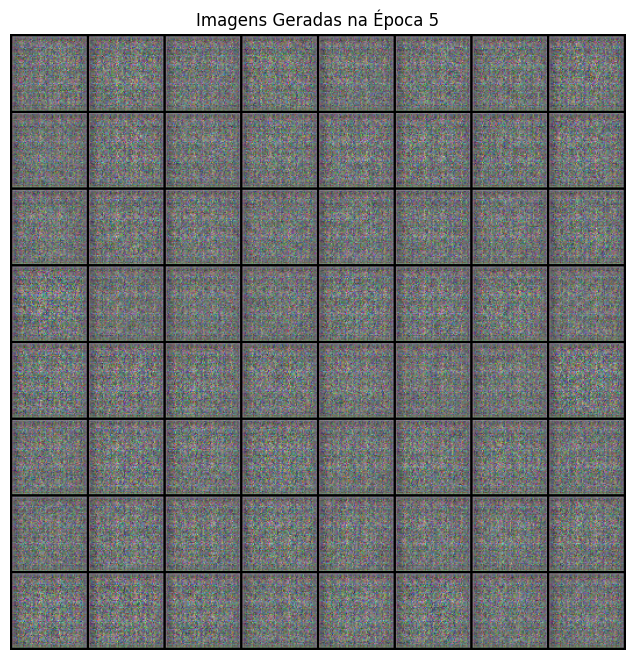

Epoch 6/50:   0%|          | 0/4 [00:00<?, ?it/s]

[6/50] Loss Crítico: -0.1443 | Loss Gerador: 0.0730


Epoch 7/50:   0%|          | 0/4 [00:00<?, ?it/s]

[7/50] Loss Crítico: -0.1943 | Loss Gerador: 0.1215


Epoch 8/50:   0%|          | 0/4 [00:00<?, ?it/s]

[8/50] Loss Crítico: -0.3062 | Loss Gerador: 0.1722


Epoch 9/50:   0%|          | 0/4 [00:00<?, ?it/s]

[9/50] Loss Crítico: -0.4067 | Loss Gerador: 0.2034


Epoch 10/50:   0%|          | 0/4 [00:00<?, ?it/s]

[10/50] Loss Crítico: -0.4735 | Loss Gerador: 0.2488


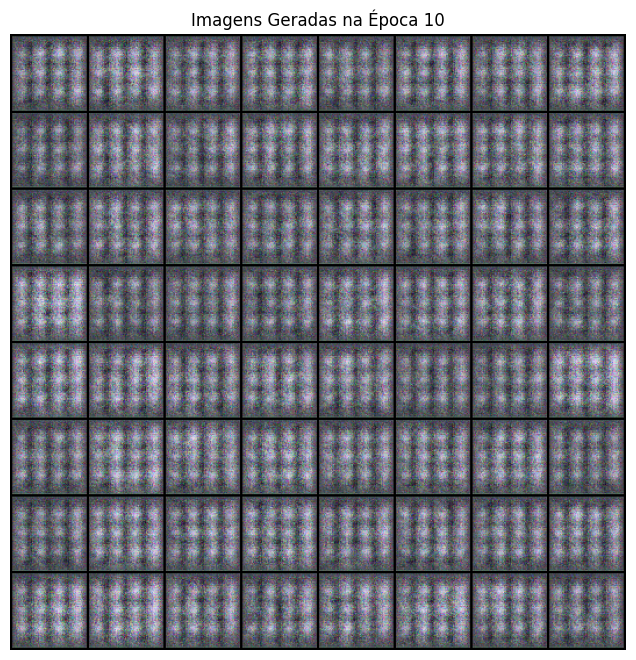

Epoch 11/50:   0%|          | 0/4 [00:00<?, ?it/s]

[11/50] Loss Crítico: -0.5747 | Loss Gerador: 0.2575


Epoch 12/50:   0%|          | 0/4 [00:00<?, ?it/s]

[12/50] Loss Crítico: -0.6286 | Loss Gerador: 0.3376


Epoch 13/50:   0%|          | 0/4 [00:00<?, ?it/s]

[13/50] Loss Crítico: -0.6715 | Loss Gerador: 0.3507


Epoch 14/50:   0%|          | 0/4 [00:00<?, ?it/s]

[14/50] Loss Crítico: -0.7187 | Loss Gerador: 0.2815


Epoch 15/50:   0%|          | 0/4 [00:00<?, ?it/s]

[15/50] Loss Crítico: -0.6900 | Loss Gerador: 0.3499


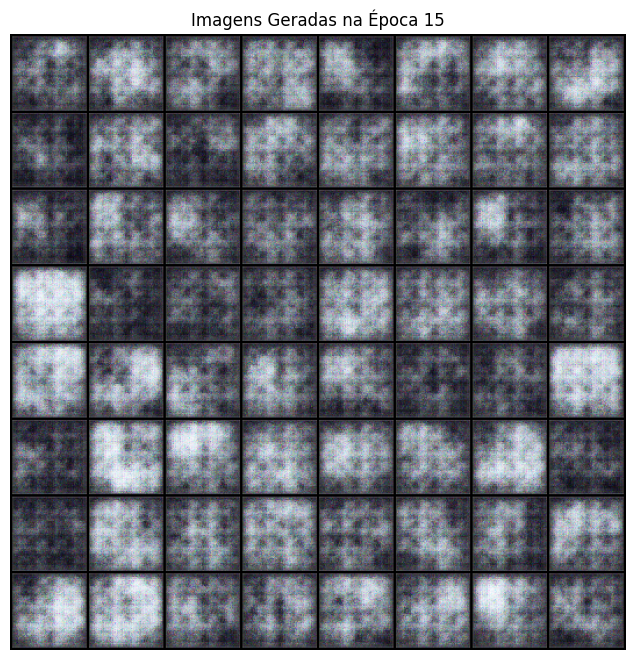

Epoch 16/50:   0%|          | 0/4 [00:00<?, ?it/s]

[16/50] Loss Crítico: -0.8358 | Loss Gerador: 0.4107


Epoch 17/50:   0%|          | 0/4 [00:00<?, ?it/s]

[17/50] Loss Crítico: -0.8831 | Loss Gerador: 0.4380


Epoch 18/50:   0%|          | 0/4 [00:00<?, ?it/s]

[18/50] Loss Crítico: -0.9801 | Loss Gerador: 0.4712


Epoch 19/50:   0%|          | 0/4 [00:00<?, ?it/s]

[19/50] Loss Crítico: -1.0094 | Loss Gerador: 0.4833


Epoch 20/50:   0%|          | 0/4 [00:00<?, ?it/s]

[20/50] Loss Crítico: -1.0365 | Loss Gerador: 0.5127


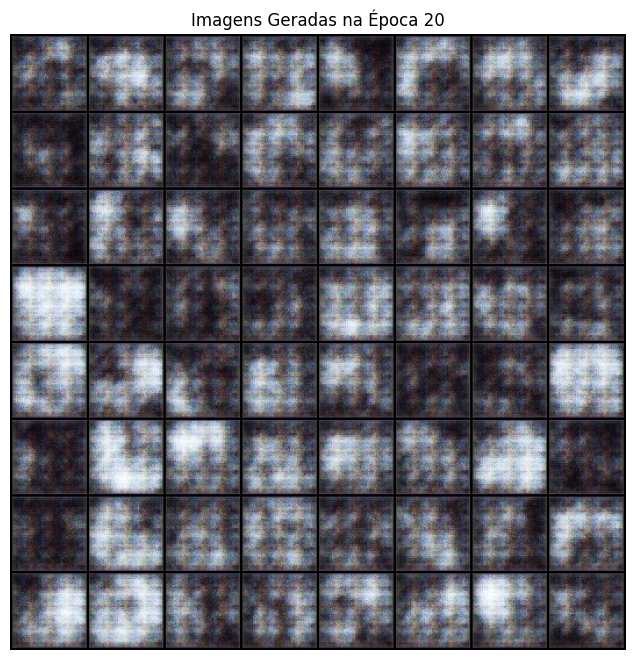

Epoch 21/50:   0%|          | 0/4 [00:00<?, ?it/s]

[21/50] Loss Crítico: -1.0876 | Loss Gerador: 0.5414


Epoch 22/50:   0%|          | 0/4 [00:00<?, ?it/s]

[22/50] Loss Crítico: -1.1782 | Loss Gerador: 0.5785


Epoch 23/50:   0%|          | 0/4 [00:00<?, ?it/s]

[23/50] Loss Crítico: -1.2403 | Loss Gerador: 0.6080


Epoch 24/50:   0%|          | 0/4 [00:00<?, ?it/s]

[24/50] Loss Crítico: -1.2099 | Loss Gerador: 0.6078


Epoch 25/50:   0%|          | 0/4 [00:00<?, ?it/s]

[25/50] Loss Crítico: -1.2728 | Loss Gerador: 0.6319


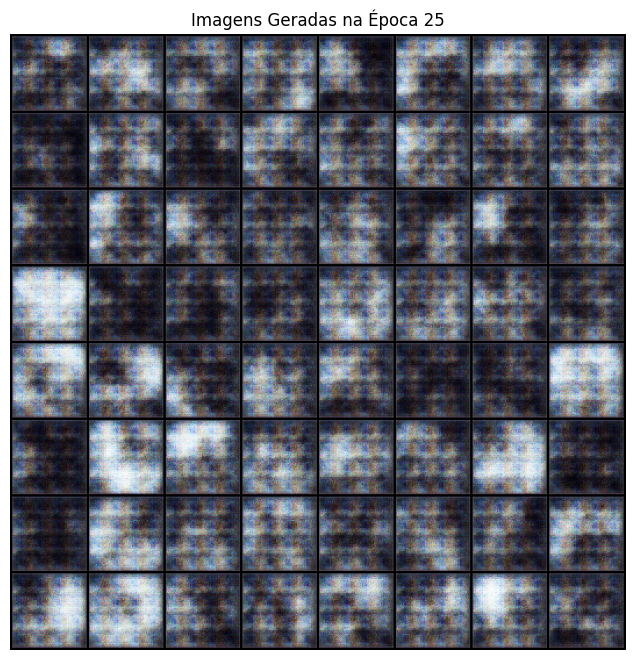

Epoch 26/50:   0%|          | 0/4 [00:00<?, ?it/s]

[26/50] Loss Crítico: -1.2517 | Loss Gerador: 0.6254


Epoch 27/50:   0%|          | 0/4 [00:00<?, ?it/s]

[27/50] Loss Crítico: -1.3242 | Loss Gerador: 0.6534


Epoch 28/50:   0%|          | 0/4 [00:00<?, ?it/s]

[28/50] Loss Crítico: -1.3170 | Loss Gerador: 0.6490


Epoch 29/50:   0%|          | 0/4 [00:00<?, ?it/s]

[29/50] Loss Crítico: -1.3626 | Loss Gerador: 0.6737


Epoch 30/50:   0%|          | 0/4 [00:00<?, ?it/s]

[30/50] Loss Crítico: -1.3169 | Loss Gerador: 0.6634


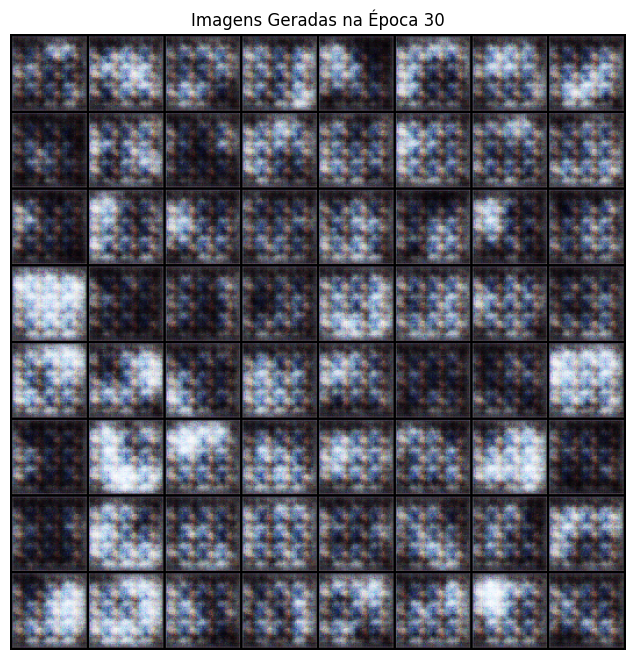

Epoch 31/50:   0%|          | 0/4 [00:00<?, ?it/s]

[31/50] Loss Crítico: -1.4004 | Loss Gerador: 0.6898


Epoch 32/50:   0%|          | 0/4 [00:00<?, ?it/s]

[32/50] Loss Crítico: -1.3567 | Loss Gerador: 0.6772


Epoch 33/50:   0%|          | 0/4 [00:00<?, ?it/s]

[33/50] Loss Crítico: -1.4001 | Loss Gerador: 0.6916


Epoch 34/50:   0%|          | 0/4 [00:00<?, ?it/s]

[34/50] Loss Crítico: -1.3700 | Loss Gerador: 0.6808


Epoch 35/50:   0%|          | 0/4 [00:00<?, ?it/s]

[35/50] Loss Crítico: -1.3617 | Loss Gerador: 0.6614


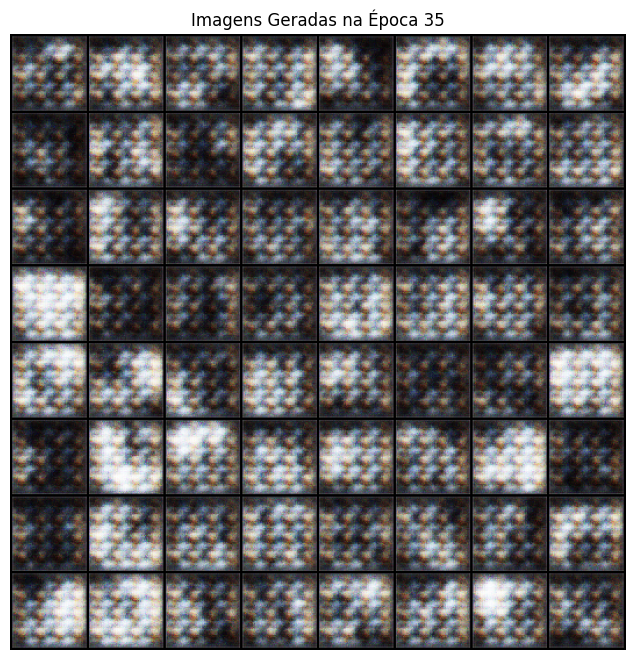

Epoch 36/50:   0%|          | 0/4 [00:00<?, ?it/s]

[36/50] Loss Crítico: -1.4306 | Loss Gerador: 0.7028


Epoch 37/50:   0%|          | 0/4 [00:00<?, ?it/s]

[37/50] Loss Crítico: -1.3972 | Loss Gerador: 0.6881


Epoch 38/50:   0%|          | 0/4 [00:00<?, ?it/s]

[38/50] Loss Crítico: -1.4419 | Loss Gerador: 0.7130


Epoch 39/50:   0%|          | 0/4 [00:00<?, ?it/s]

[39/50] Loss Crítico: -1.4122 | Loss Gerador: 0.7038


Epoch 40/50:   0%|          | 0/4 [00:00<?, ?it/s]

[40/50] Loss Crítico: -1.3916 | Loss Gerador: 0.6902


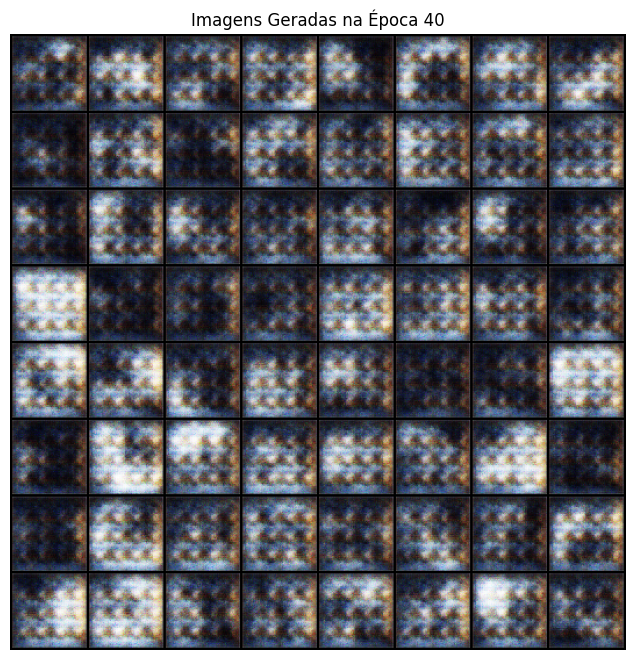

Epoch 41/50:   0%|          | 0/4 [00:00<?, ?it/s]

[41/50] Loss Crítico: -1.3907 | Loss Gerador: 0.6998


Epoch 42/50:   0%|          | 0/4 [00:00<?, ?it/s]

[42/50] Loss Crítico: -1.3662 | Loss Gerador: 0.6721


Epoch 43/50:   0%|          | 0/4 [00:00<?, ?it/s]

[43/50] Loss Crítico: -1.3916 | Loss Gerador: 0.6904


Epoch 44/50:   0%|          | 0/4 [00:00<?, ?it/s]

[44/50] Loss Crítico: -1.4263 | Loss Gerador: 0.7049


Epoch 45/50:   0%|          | 0/4 [00:00<?, ?it/s]

[45/50] Loss Crítico: -1.4195 | Loss Gerador: 0.7016


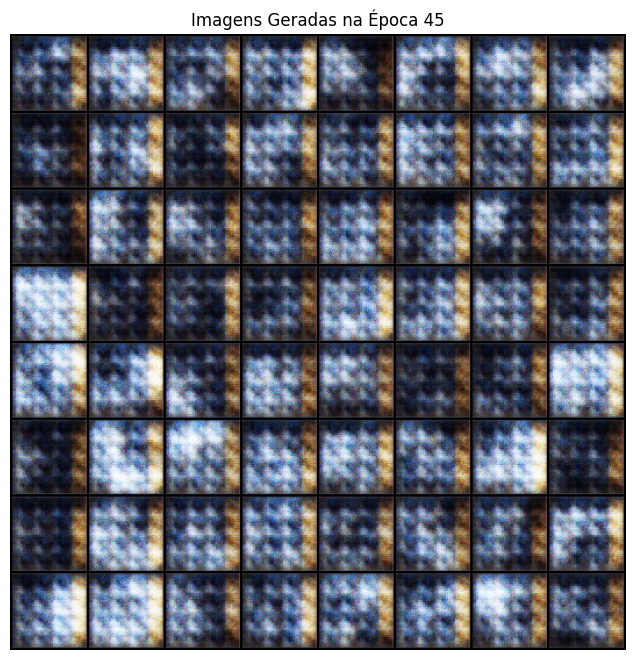

Epoch 46/50:   0%|          | 0/4 [00:00<?, ?it/s]

[46/50] Loss Crítico: -1.4052 | Loss Gerador: 0.6908


Epoch 47/50:   0%|          | 0/4 [00:00<?, ?it/s]

[47/50] Loss Crítico: -1.3885 | Loss Gerador: 0.6853


Epoch 48/50:   0%|          | 0/4 [00:00<?, ?it/s]

[48/50] Loss Crítico: -1.4319 | Loss Gerador: 0.7060


Epoch 49/50:   0%|          | 0/4 [00:00<?, ?it/s]

[49/50] Loss Crítico: -1.4203 | Loss Gerador: 0.6967


Epoch 50/50:   0%|          | 0/4 [00:00<?, ?it/s]

[50/50] Loss Crítico: -1.4297 | Loss Gerador: 0.7058


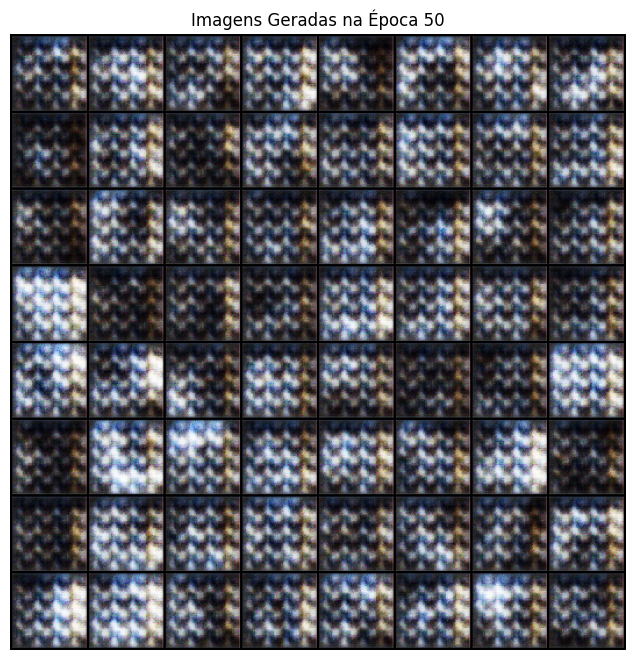

Treinamento concluído!


In [20]:
import torch
from torch import nn
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import numpy as np
from tqdm.auto import tqdm

# --- 1. Inicialização e Instanciação ---

# Hiperparâmetros
LATENT_DIM = 100
IMG_CHANNELS = 3
FEATURES_G = 64
FEATURES_D = 64
LR = 0.00005  # Taxa de aprendizado recomendada para WGAN
N_CRITIC = 5    # Número de vezes que o Crítico é treinado por atualização do Gerador
CLIP_VALUE = 0.01 # Valor para o gradient clipping
NUM_EPOCHS = 50 # Número de épocas para treinar

# Define o dispositivo para treinamento (GPU se disponível, caso contrário CPU)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")

# Função para inicializar os pesos
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# Instanciação dos modelos
generator = Generator(LATENT_DIM, IMG_CHANNELS, FEATURES_G).to(DEVICE)
critic = Critic(IMG_CHANNELS, FEATURES_D).to(DEVICE)

# Aplica a inicialização de pesos
generator.apply(weights_init)
critic.apply(weights_init)

# Otimizadores (RMSprop é recomendado para WGAN)
optimizer_g = torch.optim.RMSprop(generator.parameters(), lr=LR)
optimizer_c = torch.optim.RMSprop(critic.parameters(), lr=LR)

# Vetor de ruído fixo para visualizar a evolução do Gerador
fixed_noise = torch.randn(64, LATENT_DIM, 1, 1, device=DEVICE)

print("Modelos e otimizadores inicializados. Iniciando treinamento...")

# --- 2. Loop de Treinamento ---

# Listas para armazenar as perdas
losses_g = []
losses_c = []

for epoch in range(NUM_EPOCHS):
    for i, real_imgs in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS}")):
        real_imgs = real_imgs.to(DEVICE)
        batch_size = real_imgs.size(0)

        # --- Treinamento do Crítico (n_critic iterações) ---
        for _ in range(N_CRITIC):
            optimizer_c.zero_grad()

            # Gera ruído e imagens falsas
            noise = torch.randn(batch_size, LATENT_DIM, 1, 1, device=DEVICE)
            fake_imgs = generator(noise).detach()

            # Calcula os scores
            score_real = critic(real_imgs).view(-1)
            score_fake = critic(fake_imgs).view(-1)

            # Calcula a perda do Crítico (Wasserstein loss)
            loss_c = -(torch.mean(score_real) - torch.mean(score_fake))

            loss_c.backward()
            optimizer_c.step()

            # Aplica o gradient clipping nos parâmetros do Crítico
            for p in critic.parameters():
                p.data.clamp_(-CLIP_VALUE, CLIP_VALUE)

        # --- Treinamento do Gerador ---
        optimizer_g.zero_grad()

        # Gera novas imagens falsas (sem .detach() desta vez)
        noise = torch.randn(batch_size, LATENT_DIM, 1, 1, device=DEVICE)
        fake_imgs = generator(noise)

        # Calcula o score das imagens falsas
        score_fake = critic(fake_imgs).view(-1)

        # Calcula a perda do Gerador
        loss_g = -torch.mean(score_fake)

        loss_g.backward()
        optimizer_g.step()

    # --- Fim da Época: Registro e Visualização ---
    avg_loss_g = loss_g.item()
    avg_loss_c = loss_c.item()
    losses_g.append(avg_loss_g)
    losses_c.append(avg_loss_c)

    print(f"[{epoch+1}/{NUM_EPOCHS}] Loss Crítico: {avg_loss_c:.4f} | Loss Gerador: {avg_loss_g:.4f}")

    # Visualiza amostras geradas a cada época
    if (epoch + 1) % 5 == 0: # Visualiza a cada 5 épocas
        with torch.no_grad():
            generator.eval() # Modo de avaliação para geração
            generated_samples = generator(fixed_noise).detach().cpu()

            # Desnormaliza e plota as imagens
            grid = vutils.make_grid(generated_samples, padding=2, normalize=True)
            plt.figure(figsize=(8, 8))
            plt.axis("off")
            plt.title(f"Imagens Geradas na Época {epoch+1}")
            plt.imshow(np.transpose(grid, (1, 2, 0)))
            plt.show()

            generator.train() # Volta para o modo de treino

print("Treinamento concluído!")

## Inferência

Após o treinamento, utilize o **Gerador** para produzir novas imagens a partir de **vetores de ruído aleatório**.
Cada vetor servirá como ponto de partida no espaço latente, sendo transformado pelo modelo em uma amostra sintética do domínio aprendido.

Durante a inferência:

* Gere múltiplas imagens e visualize os resultados.
* Analise a **qualidade e diversidade** das amostras produzidas.

In [21]:
# Importando bibliotecas para visualização
import matplotlib.pyplot as plt
import torchvision.utils as vutils
import numpy as np

# --- 1. Preparação para a Inferência ---

# Garante que o gerador esteja em modo de avaliação
# Isso desativa camadas como BatchNorm e Dropout, se existirem e forem usadas de forma diferente na inferência.
generator.eval()

# Número de imagens a serem geradas
num_images_to_generate = 16

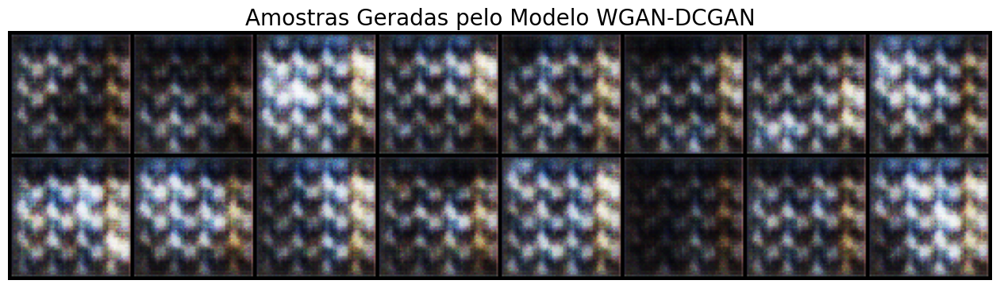

In [22]:
# --- 2. Geração das Imagens ---

# Cria um lote de vetores de ruído aleatórios
# Cada vetor será o ponto de partida para gerar uma imagem única
noise = torch.randn(num_images_to_generate, LATENT_DIM, 1, 1, device=DEVICE)

# Gera as imagens. O 'with torch.no_grad()' desativa o cálculo de gradientes,
# tornando a inferência mais rápida e economizando memória.
with torch.no_grad():
    fake_images = generator(noise).detach().cpu()

# --- 3. Visualização dos Resultados ---

# Função para desnormalizar as imagens (de [-1, 1] para [0, 1])
def denormalize(tensor):
    return tensor * 0.5 + 0.5

# Cria uma grade com as imagens geradas para facilitar a visualização
grid = vutils.make_grid(denormalize(fake_images), padding=2, normalize=False, nrow=8)

# Plota a grade de imagens
plt.figure(figsize=(16, 8))
plt.axis("off")
plt.title("Amostras Geradas pelo Modelo WGAN-DCGAN", fontsize=20)
plt.imshow(np.transpose(grid, (1, 2, 0))) # Converte de (C, H, W) para (H, W, C) para o matplotlib
plt.show()

# E dessa forma, conseguimos chegar no padrão da calvice do surfista.